# Installing requirements and loading log file.

In [ ]:
! pip install pm4py

In [ ]:
import pm4py
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
from scipy.stats import chi2_contingency
from wordcloud import WordCloud
import numpy as np

In [ ]:
logPath="./drive/MyDrive/Colab Notebooks/BIS/project/log_file.xes"
log = pm4py.read_xes(logPath)
df = pm4py.convert_to_dataframe(log)
log['time:timestamp']= pd.to_datetime(log['time:timestamp'])

/usr/local/lib/python3.10/dist-packages/pm4py/util/dt_parsing/parser.py:76: UserWarning: ISO8601 strings are not fully supported with strpfromiso for Python versions below 3.11
  warnings.warn(


parsing log, completed traces ::   0%|          | 0/251734 [00:00<?, ?it/s]

# Exploring log file

in the first step, we check frequency of each variant.

In [ ]:
variants = pm4py.get_variants(log)
variants = sorted(variants.items(), key=lambda x: x[1],reverse=True)

The variants are sorted based on the frequency, we draw the bar chart for variant frequency of the first 200 variants.

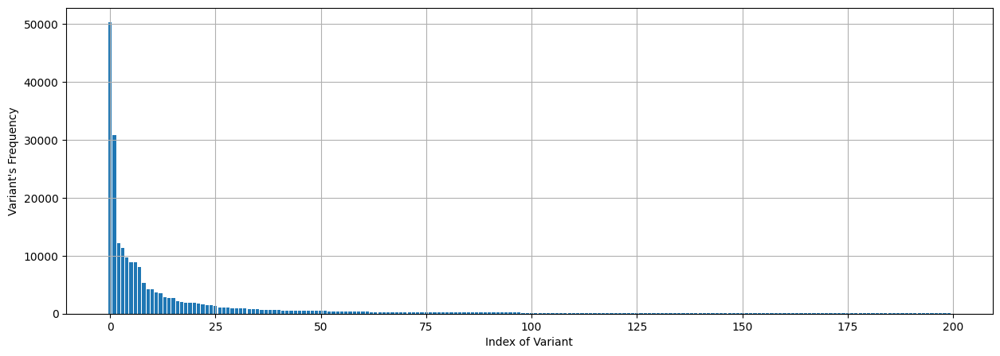

In [ ]:
values = [item[1] for item in variants[:200]]
plt.figure(figsize=(15, 5))
plt.grid()
plt.xlabel('Index of Variant')
plt.ylabel('Variant\'s Frequency')
plt.bar(range(len(values)), values)
plt.show()

now we try to find out how many variants we need to obtain 90% of information stored in log file.

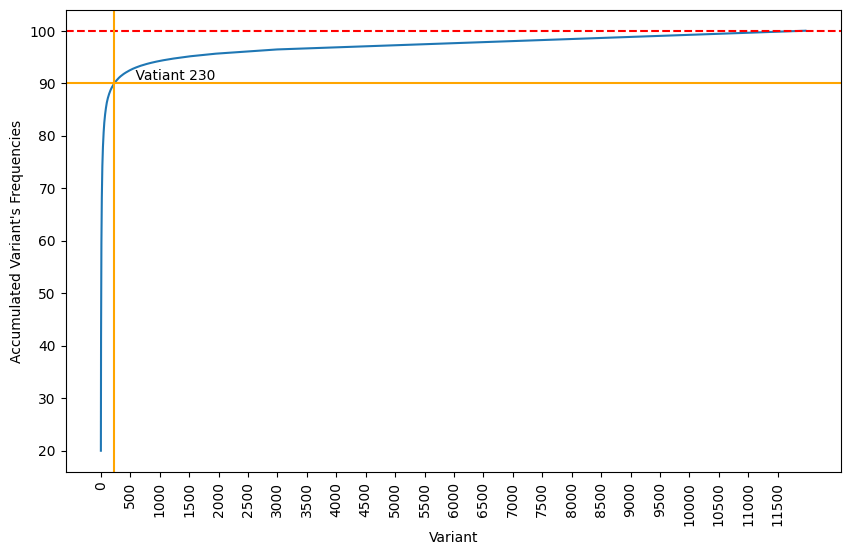

In [ ]:
total_frequency = sum(value for _, value in variants)
accumulated_frequencies = []
accumulated_frequency = 0

for _, value in variants:
    accumulated_frequency += value
    accumulated_frequencies.append( (accumulated_frequency/total_frequency) * 100)

plt.figure(figsize=(10, 6))
plt.plot(range(len(accumulated_frequencies)), accumulated_frequencies)
plt.xlabel('Variant')
plt.ylabel('Accumulated Variant\'s Frequencies')
plt.xticks(range(0, len(accumulated_frequencies), 500), rotation=90)
plt.axhline(y=100, color='r', linestyle='--')
plt.axhline(y=90, color='orange', linestyle='-')
index_90 = min(range(len(accumulated_frequencies)), key=lambda i: abs(accumulated_frequencies[i] - 90))
plt.axvline(x=index_90, color='orange', linestyle='-')
plt.text(index_90, 90, f'                            Vatiant {index_90}', ha='center', va='bottom')

plt.show()

accumulative frequency of top 50 variants is 81%, however we will select top 230 variants to cover 90%

In [ ]:
accumulated_frequencies[49]

81.0486465872707

Another aspect to consider is activity frequency. we compute frequency of activities:

In [ ]:
frequency = df["concept:name"].value_counts().reset_index()
frequency.columns = ["concept:name", "Frequency"]
total = frequency["Frequency"].sum()
frequency["Percentage"] = frequency["Frequency"] / total * 100
frequency.index = frequency.index + 1
frequency[:10]

,concept:name,Frequency,Percentage
1,Record Goods Receipt,314097,19.681213
2,Create Purchase Order Item,251734,15.773568
3,Record Invoice Receipt,228760,14.334025
4,Vendor creates invoice,219919,13.780051
5,Clear Invoice,194393,12.180600
6,Record Service Entry Sheet,164975,10.337278
7,Remove Payment Block,57136,3.580123
8,Create Purchase Requisition Item,46592,2.919439
9,Receive Order Confirmation,32065,2.009182
10,Change Quantity,21449,1.343987


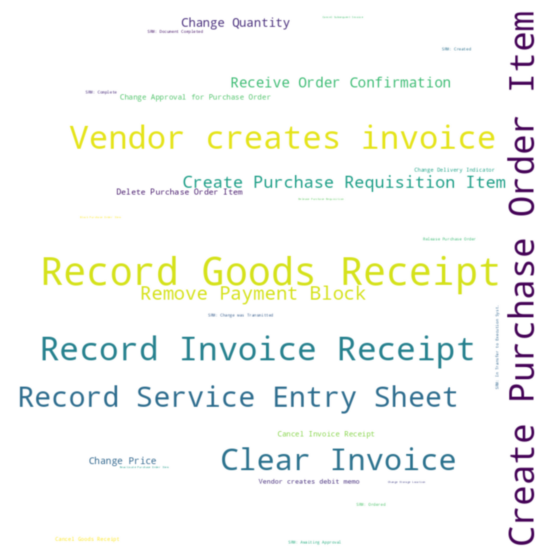

In [ ]:
# to understand it better, we try to generate a word cloud chart as well:
keyword_data =frequency.set_index('concept:name')['Frequency'].to_dict()
wordcloud = WordCloud(background_color='white', width=800, height=800)
wordcloud.generate_from_frequencies(keyword_data)
plt.figure(figsize=(7, 7))
plt.imshow(wordcloud, interpolation='bicubic')
plt.axis('off')
plt.show()

It is a good consideration to check the list of start and end activities. we can use this list to detect some anomalies and use it during filtering phase:


In [ ]:
log_start = pm4py.get_start_activities(log)
log_end = pm4py.get_end_activities(log)

In [ ]:
log_start

{'Create Purchase Order Item': 199867,
 'Create Purchase Requisition Item': 46526,
 'Vendor creates invoice': 3457,
 'SRM: Created': 1360,
 'Change Approval for Purchase Order': 378,
 'Vendor creates debit memo': 122,
 'Release Purchase Order': 22,
 'Change Currency': 2}

In [ ]:
log_end

{'Clear Invoice': 181328,
 'Record Invoice Receipt': 23091,
 'Record Goods Receipt': 22776,
 'Delete Purchase Order Item': 8123,
 'Remove Payment Block': 5397,
 'Create Purchase Order Item': 4447,
 'Cancel Invoice Receipt': 1348,
 'Change Approval for Purchase Order': 1346,
 'Record Service Entry Sheet': 921,
 'Change Delivery Indicator': 718,
 'Change Price': 529,
 'Change Quantity': 525,
 'Cancel Goods Receipt': 440,
 'Receive Order Confirmation': 232,
 'Block Purchase Order Item': 167,
 'Vendor creates invoice': 68,
 'Set Payment Block': 61,
 'SRM: Change was Transmitted': 47,
 'SRM: Transfer Failed (E.Sys.)': 44,
 'SRM: In Transfer to Execution Syst.': 30,
 'Cancel Subsequent Invoice': 24,
 'Change Storage Location': 20,
 'Reactivate Purchase Order Item': 14,
 'Record Subsequent Invoice': 9,
 'SRM: Deleted': 9,
 'SRM: Transaction Completed': 6,
 'Vendor creates debit memo': 5,
 'Change Final Invoice Indicator': 3,
 'Update Order Confirmation': 3,
 'Change Currency': 1,
 'Release Pu

Another aspect to consider is case duration to be complete. it is also knows as performance.

number of cases:  251734


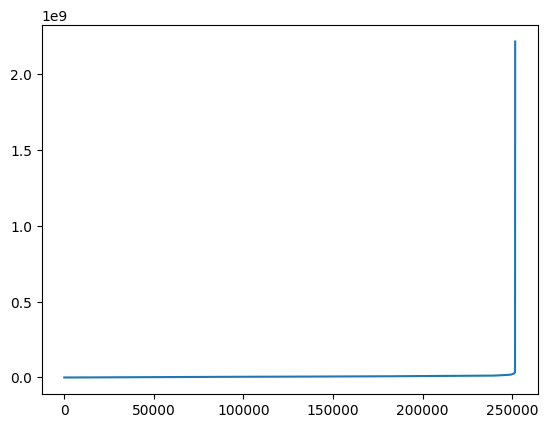

In [ ]:
durations = pm4py.get_all_case_durations(log)
print("number of cases: ",len(durations))
x_values = range(len(durations))
plt.plot(x_values, durations)
plt.show()

Another aspect to consider is frequency of each four category. according to the documentation we have four categories. we try to illustrate the frequency of each one by drawing a bar chart:

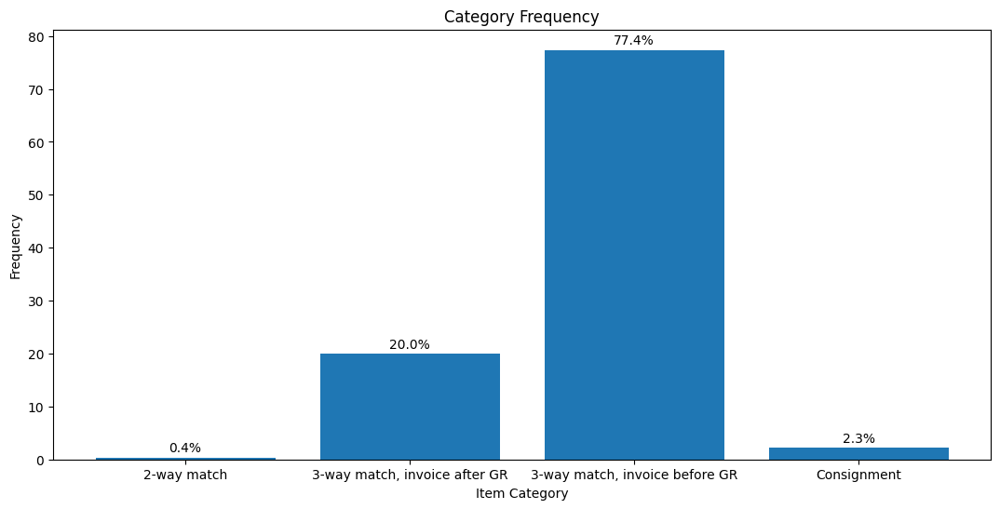

In [ ]:
category_frequencies = (df.groupby('case:Item Category').size() / len(df)) * 100
plt.figure(figsize=(13, 6))
plt.bar(category_frequencies.index, category_frequencies.values)
plt.xlabel('Item Category')
plt.ylabel('Frequency')
plt.title('Category Frequency')
for i, v in enumerate(category_frequencies.values):
    plt.text(i, v + 0.5, f'{v:.1f}%', ha='center', va='bottom')
plt.show()

# Applying filters and noise removal

the first filter is related to case duration.

In [ ]:
filtered_log = pm4py.filter_case_performance(log, 60, 18144000)

number of cases:  245042


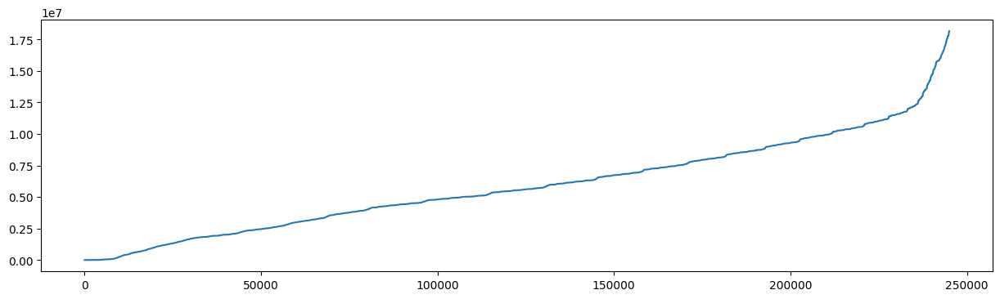

In [ ]:
durations = pm4py.get_all_case_durations(filtered_log)
print("number of cases: ",len(durations))
x_values = range(len(durations))
plt.figure(figsize=(15, 4))
plt.plot(x_values, durations)
plt.show()

The second filter is top-k variant

In [ ]:
k = 231
filtered_log = pm4py.filter_variants_top_k(filtered_log, k)
print("remaining cases:",len(pm4py.get_all_case_durations(filtered_log)))

remaining cases: 222355


Also we try to filter based on the start or end activiy. we consider activities in which starts with :

{'Create Purchase Order Item': 199867,
 'Create Purchase Requisition Item': 46526,
 'Vendor creates invoice': 3457,
 'SRM: Created': 1360,
 'Vendor creates debit memo': 122,}


---





**And ends with:**


{'Clear Invoice': 181328,
 'Record Invoice Receipt': 23091,
 'Record Goods Receipt': 22776,
 'Delete Purchase Order Item': 8123,
 'Remove Payment Block': 5397,
 'Cancel Invoice Receipt': 1348,
 'Change Approval for Purchase Order': 1346,
 'Change Delivery Indicator': 718,
 'Cancel Goods Receipt': 440,
 'Receive Order Confirmation': 232,
 'Block Purchase Order Item': 167,
 'Set Payment Block': 61,
 'SRM: Change was Transmitted': 47,
 'SRM: Transfer Failed (E.Sys.)': 44,
 'SRM: In Transfer to Execution Syst.': 30,
 'Cancel Subsequent Invoice': 24,
 'SRM: Deleted': 9,
 'SRM: Transaction Completed': 6,
 'Update Order Confirmation': 3}


In [ ]:
filtered_log = pm4py.filter_start_activities(filtered_log,["Create Purchase Order Item",
"Create Purchase Requisition Item",
"Vendor creates invoice",
"SRM: Created",
"Vendor creates debit memo"])


filtered_log = pm4py.filter_end_activities(filtered_log, [
"Clear Invoice",
"Record Invoice Receipt",
"Record Goods Receipt",
"Delete Purchase Order Item",
"Remove Payment Block",
"Cancel Invoice Receipt",
"Change Approval for Purchase Order",
"Change Delivery Indicator",
"Cancel Goods Receipt",
"Receive Order Confirmation",
"Block Purchase Order Item",
"Set Payment Block",
"SRM: Change was Transmitted",
"SRM: Transfer Failed (E.Sys.)",
"SRM: In Transfer to Execution Syst.",
"Cancel Subsequent Invoice",
"SRM: Deleted",
"SRM: Transaction Completed",
"Update Order Confirmation"])

print("remaining cases:",len(pm4py.get_all_case_durations(filtered_log)))

remaining cases: 219997


the next filter is based on activity repetition. for example it is not meaningfull for a case, we have multiple delete invoice.

In [ ]:
cases_to_exclude = pd.concat([
    pm4py.filter_activities_rework(filtered_log, "Clear Invoice", 2),
    pm4py.filter_activities_rework(filtered_log, "Record Goods Receipt", 2),
    pm4py.filter_activities_rework(filtered_log, "Record Invoice Receipt", 2)
    ])
cases_to_exclude = cases_to_exclude["case:concept:name"].unique()

print("cases to exclude:",len(cases_to_exclude))
print("total cases:", len(filtered_log["case:concept:name"].unique()))
filtered_log = filtered_log[~filtered_log['case:concept:name'].isin(cases_to_exclude)]
print("total cases:", len(filtered_log["case:concept:name"].unique()))

cases to exclude: 4100
total cases: 219997
total cases: 215897


# Process Discovery

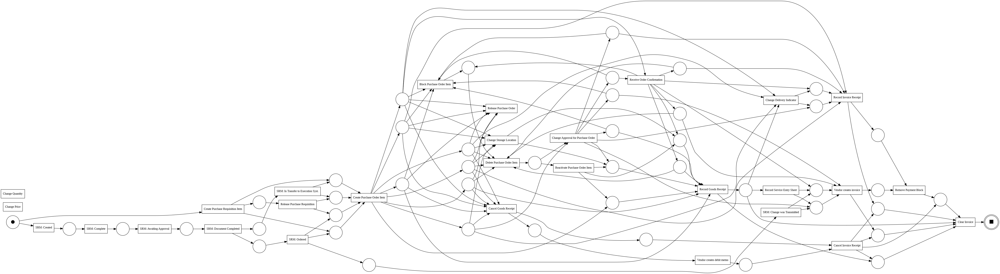

In [ ]:
#alpha miner
net, initial_marking, final_marking = pm4py.discover_petri_net_alpha(filtered_log)
pm4py.view_petri_net(net, initial_marking, final_marking)

In [ ]:
# fitness for alpha miner:
print("replay based fitness:",pm4py.fitness_token_based_replay(filtered_log, net, initial_marking, final_marking))
print("replay based precision:",pm4py.precision_token_based_replay(filtered_log, net, initial_marking, final_marking))
print("generalization:",generalization_evaluator.apply(filtered_log, net, initial_marking, final_marking))
print("simplicity:",simplicity_evaluator.apply(net))

replaying log with TBR, completed variants ::   0%|          | 0/176 [00:00<?, ?it/s]

replay based fitness: {'perc_fit_traces': 0.0, 'average_trace_fitness': 0.5092426986462707, 'log_fitness': 0.5242873315790858, 'percentage_of_fitting_traces': 0.0}


replaying log with TBR, completed variants ::   0%|          | 0/306 [00:00<?, ?it/s]

replay based precision: 0.494899261399368


replaying log with TBR, completed variants ::   0%|          | 0/176 [00:00<?, ?it/s]

generalization: 0.9633541129012378
simplicity: 0.3424657534246575


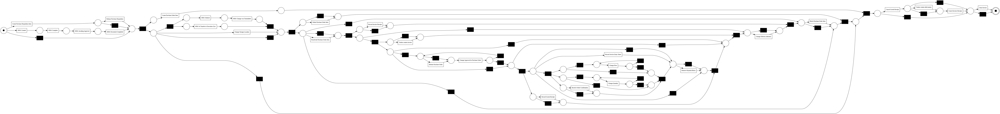

In [ ]:
# inductive minder:
net, initial_marking, final_marking = pm4py.discover_petri_net_inductive(filtered_log)
pm4py.view_petri_net(net, initial_marking, final_marking)

In [ ]:
# fitness for inductive miner:
print("replay based fitness:",pm4py.fitness_token_based_replay(filtered_log, net, initial_marking, final_marking))
print("replay based precision:",pm4py.precision_token_based_replay(filtered_log, net, initial_marking, final_marking))
print("generalization:",generalization_evaluator.apply(filtered_log, net, initial_marking, final_marking))
print("simplicity:",simplicity_evaluator.apply(net))

replaying log with TBR, completed variants ::   0%|          | 0/176 [00:00<?, ?it/s]

replay based fitness: {'perc_fit_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 1.0, 'percentage_of_fitting_traces': 100.0}


replaying log with TBR, completed variants ::   0%|          | 0/306 [00:00<?, ?it/s]

replay based precision: 0.26443943144365356


replaying log with TBR, completed variants ::   0%|          | 0/176 [00:00<?, ?it/s]

generalization: 0.9735323249242931
simplicity: 0.6221198156682027


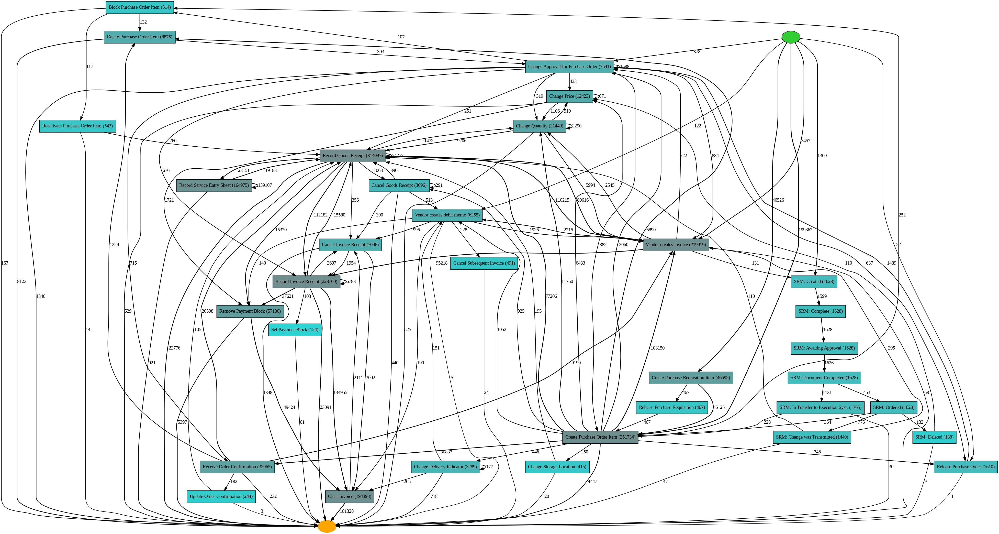

In [ ]:
#Huristic minder
heu_net = pm4py.discover_heuristics_net(log, dependency_threshold=0.99,and_threshold = 0.99,loop_two_threshold=0.99)
pm4py.view_heuristics_net(heu_net)

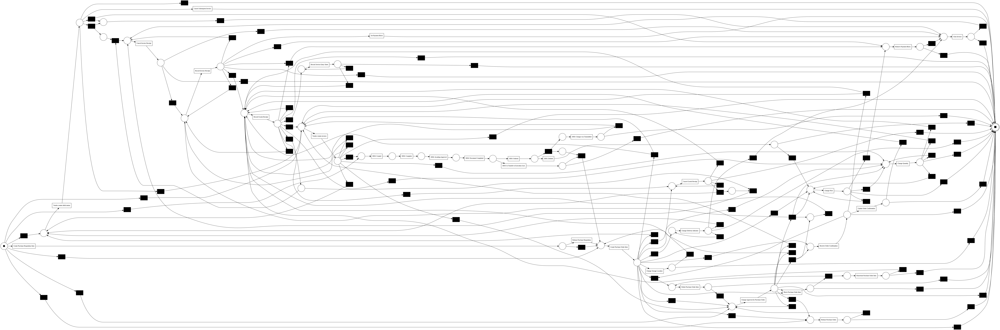

In [ ]:
#Petri-net of huristic miner:
net, im, fm = pm4py.discover_petri_net_heuristics(log, dependency_threshold=0.99,and_threshold = 0.99,loop_two_threshold=0.99)
pm4py.view_petri_net(net, im, fm)

In [ ]:
# fitness for huristic miner:
print("replay based fitness:",pm4py.fitness_token_based_replay(filtered_log, net, initial_marking, final_marking))
print("replay based precision:",pm4py.precision_token_based_replay(filtered_log, net, initial_marking, final_marking))
print("generalization:",generalization_evaluator.apply(filtered_log, net, initial_marking, final_marking))
print("simplicity:",simplicity_evaluator.apply(net))

replaying log with TBR, completed variants ::   0%|          | 0/176 [00:00<?, ?it/s]

replay based fitness: {'perc_fit_traces': 0.0, 'average_trace_fitness': 0.6987953195547605, 'log_fitness': 0.7272417641487993, 'percentage_of_fitting_traces': 0.0}


replaying log with TBR, completed variants ::   0%|          | 0/306 [00:00<?, ?it/s]

replay based precision: 1.0


replaying log with TBR, completed variants ::   0%|          | 0/176 [00:00<?, ?it/s]

generalization: 0.5048791511643185
simplicity: 0.5039164490861618


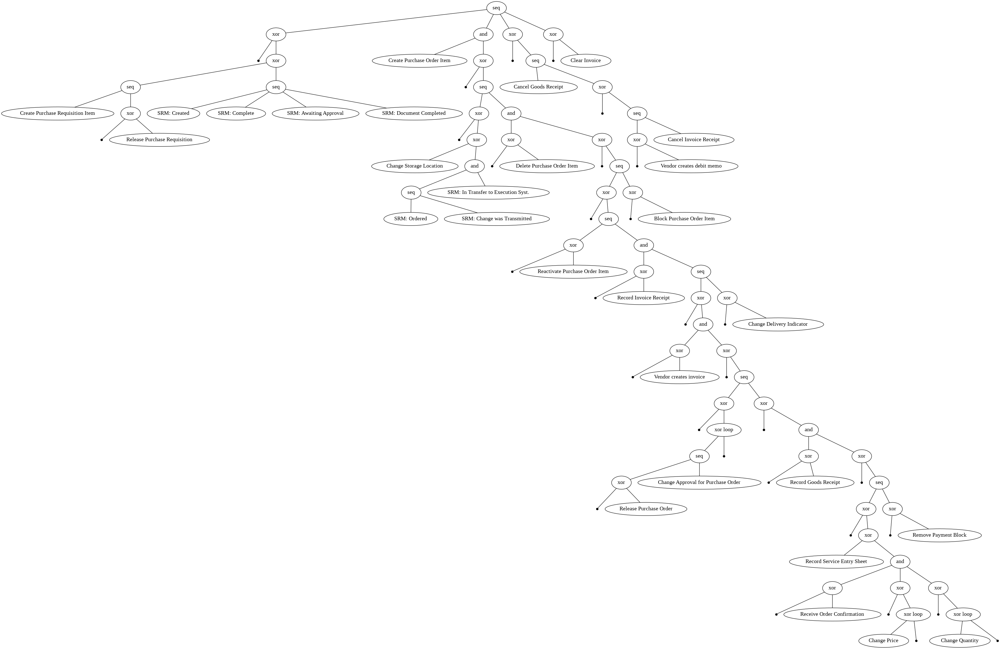

In [ ]:
# process tree
tree = pm4py.discover_process_tree_inductive(filtered_log)
pm4py.view_process_tree(tree)

to understand performance of each algorithm better, we try to illustrate it via heat map:

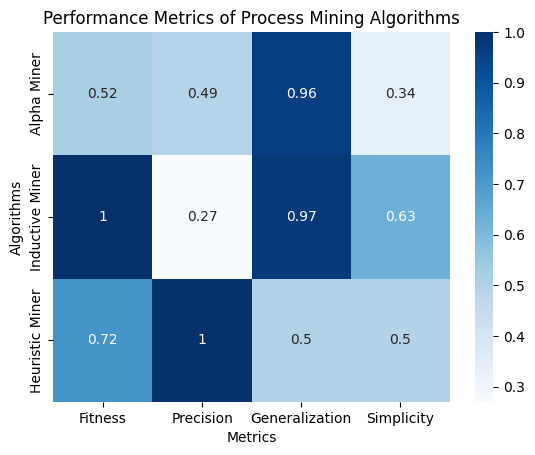

In [ ]:
data = {'Algorithm': ['Alpha Miner', 'Inductive Miner', 'Heuristic Miner'],
        'Fitness': [0.52, 1.0, 0.72],
        'Precision': [0.49, 0.27, 1.0],
        'Generalization': [0.96, 0.97, 0.50],
        'Simplicity': [0.34, 0.63, 0.50]}
chart_dataframe = pd.DataFrame(data)
chart_dataframe.set_index('Algorithm', inplace=True)
sns.heatmap(chart_dataframe, annot=True, cmap='Blues')
plt.title('Performance Metrics of Process Mining Algorithms')
plt.xlabel('Metrics')
plt.ylabel('Algorithms')
plt.show()

# Segmenting Data

In this section, we try to perform our analysis on subsection of log file. we divide log file into 4 categories and then perform above mentioned operations on each one.

In [ ]:
def categorizeLogFile(log,categories):
  return {
        item: pm4py.filter_event_attribute_values(log, "case:Item Category", [item], level="case", retain=True)
        for item in categories
    }
segmentedData = categorizeLogFile(log,["2-way match", "3-way match, invoice after GR","3-way match, invoice before GR", "Consignment"])

In [ ]:
#apply filters:
def filter(input):
  log = input.copy()
  log = pm4py.filter_case_performance(log, 60, 18144000)
  log = pm4py.filter_variants_top_k(log, k)
  log = pm4py.filter_start_activities(log,["Create Purchase Order Item","Create Purchase Requisition Item","Vendor creates invoice","SRM: Created","Vendor creates debit memo"])
  log = pm4py.filter_end_activities(log, [
  "Clear Invoice",
  "Record Invoice Receipt",
  "Record Goods Receipt",
  "Delete Purchase Order Item",
  "Remove Payment Block",
  "Cancel Invoice Receipt",
  "Change Approval for Purchase Order",
  "Change Delivery Indicator",
  "Cancel Goods Receipt",
  "Receive Order Confirmation",
  "Block Purchase Order Item",
  "Set Payment Block",
  "SRM: Change was Transmitted",
  "SRM: Transfer Failed (E.Sys.)",
  "SRM: In Transfer to Execution Syst.",
  "Cancel Subsequent Invoice",
  "SRM: Deleted",
  "SRM: Transaction Completed",
  "Update Order Confirmation"])
  cases_to_exclude = pd.concat([
    pm4py.filter_activities_rework(log, "Clear Invoice", 2),
    pm4py.filter_activities_rework(log, "Record Goods Receipt", 2),
    pm4py.filter_activities_rework(log, "Record Invoice Receipt", 2)
    ])
  cases_to_exclude = cases_to_exclude["case:concept:name"].unique()
  log = log[~log['case:concept:name'].isin(cases_to_exclude)]
  return log

In [ ]:
for item in segmentedData:
  print("number of cases in",item," before filtering:", len(segmentedData[item]["case:concept:name"].unique()))
  segmentedData[item] = filter(segmentedData[item])
  print("number of cases in",item," after filtering:", len(segmentedData[item]["case:concept:name"].unique()))
  print("\n")

number of cases in 2-way match  before filtering: 1044
number of cases in 2-way match  after filtering: 677


number of cases in 3-way match, invoice after GR  before filtering: 15182
number of cases in 3-way match, invoice after GR  after filtering: 9068


number of cases in 3-way match, invoice before GR  before filtering: 221010
number of cases in 3-way match, invoice before GR  after filtering: 194933


number of cases in Consignment  before filtering: 14498
number of cases in Consignment  after filtering: 12501




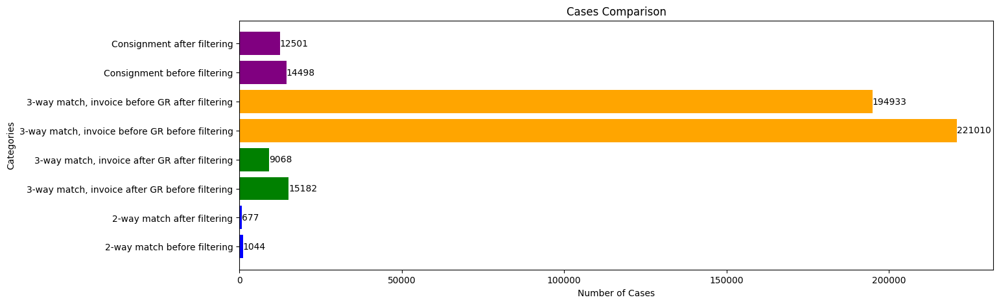

In [ ]:
categories = [
    '2-way match before filtering',
    '2-way match after filtering',
    '3-way match, invoice after GR before filtering',
    '3-way match, invoice after GR after filtering',
    '3-way match, invoice before GR before filtering',
    '3-way match, invoice before GR after filtering',
    'Consignment before filtering',
    'Consignment after filtering'
]
values = [1044, 677, 15182, 9068, 221010, 194933, 14498, 12501]
colors = ['blue', 'blue', 'green', 'green', 'orange', 'orange', 'purple', 'purple']
plt.figure(figsize=(15, 5))
bars = plt.barh(categories, values, color=colors)
for bar, value in zip(bars, values):
    plt.text(value, bar.get_y() + bar.get_height() / 2, str(value), ha='left', va='center')

plt.xlabel('Number of Cases')
plt.ylabel('Categories')
plt.title('Cases Comparison')
plt.show()

In [ ]:
#for the 3-way match, invoice after GR, it should contains "Record Goods Receipt" and also "Record Invoice Receipt"
segmentedData["3-way match, invoice after GR"] = pm4py.filter_activities_rework(segmentedData["3-way match, invoice after GR"], "Record Invoice Receipt", 1)
segmentedData["3-way match, invoice after GR"] = pm4py.filter_activities_rework(segmentedData["3-way match, invoice after GR"], "Record Goods Receipt", 1)
print("size of \"3-way match, invoice after GR\" after filter:",len(segmentedData["3-way match, invoice after GR"]["case:concept:name"].unique()))

size of "3-way match, invoice after GR" after filter: 8105


In [ ]:
#for the 3-way matching, invoice before goods receipt, it should contains "Record Goods Receipt"
segmentedData["3-way match, invoice before GR"] = pm4py.filter_activities_rework(segmentedData["3-way match, invoice before GR"], "Record Goods Receipt", 1)
print("size of \"3-way match, invoice before GR\" after filter:",len(segmentedData["3-way match, invoice before GR"]["case:concept:name"].unique()))

size of "3-way match, invoice before GR" after filter: 185608


In [ ]:
for item in segmentedData:
  print(item)

2-way match
3-way match, invoice after GR
3-way match, invoice before GR
Consignment


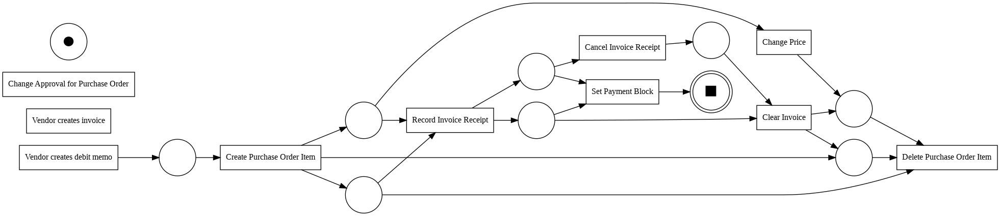

replaying log with TBR, completed variants ::   0%|          | 0/44 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/109 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/44 [00:00<?, ?it/s]

replay based fitness: {'perc_fit_traces': 0.0, 'average_trace_fitness': 0.2818061124006464, 'log_fitness': 0.3434458073785959, 'percentage_of_fitting_traces': 0.0}
replay based precision: 0.6566479877738156
generalization: 0.6910345485341971
simplicity: 0.7692307692307694


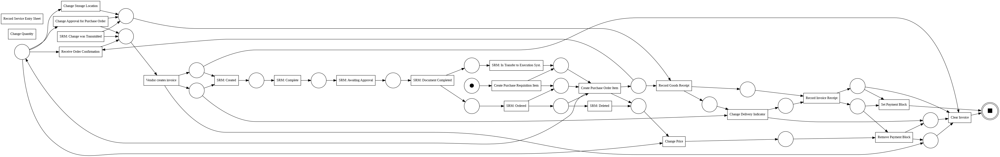

replaying log with TBR, completed variants ::   0%|          | 0/116 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/277 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/116 [00:00<?, ?it/s]

replay based fitness: {'perc_fit_traces': 0.0, 'average_trace_fitness': 0.4918390801534059, 'log_fitness': 0.5087853658537318, 'percentage_of_fitting_traces': 0.0}
replay based precision: 0.24672120503830675
generalization: 0.8947922968754881
simplicity: 0.5581395348837209


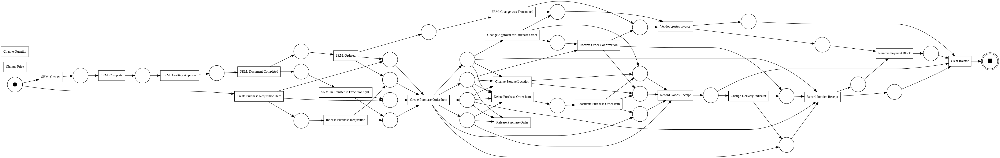

replaying log with TBR, completed variants ::   0%|          | 0/154 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/308 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/154 [00:00<?, ?it/s]

replay based fitness: {'perc_fit_traces': 0.0, 'average_trace_fitness': 0.6178628861167056, 'log_fitness': 0.6273747233576493, 'percentage_of_fitting_traces': 0.0}
replay based precision: 0.4945806608071185
generalization: 0.9541652372786179
simplicity: 0.4666666666666667


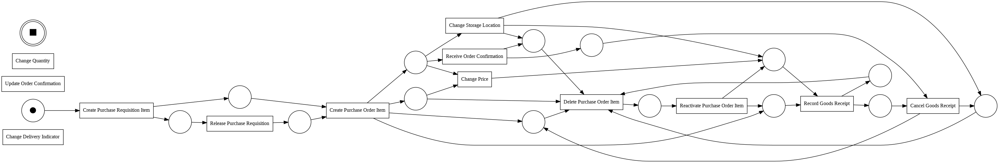

replaying log with TBR, completed variants ::   0%|          | 0/78 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/67 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/78 [00:00<?, ?it/s]

replay based fitness: {'perc_fit_traces': 0.0, 'average_trace_fitness': 0.22529963459287342, 'log_fitness': 0.23502902596330805, 'percentage_of_fitting_traces': 0.0}
replay based precision: 0.24989257237438922
generalization: 0.8481830740965002
simplicity: 0.6170212765957447


In [ ]:
#alpha miner
alpha_miner_heatmap = {}
for item in segmentedData:
  net, initial_marking, final_marking = pm4py.discover_petri_net_alpha(segmentedData[item])
  pm4py.view_petri_net(net, initial_marking, final_marking)

  fitness = pm4py.fitness_token_based_replay(segmentedData[item], net, initial_marking, final_marking)
  precision = pm4py.precision_token_based_replay(segmentedData[item], net, initial_marking, final_marking)
  generalization = generalization_evaluator.apply(segmentedData[item], net, initial_marking, final_marking)
  simplicity = simplicity_evaluator.apply(net)

  alpha_miner_heatmap[item] = [fitness["log_fitness"],precision,generalization,simplicity]

  print("replay based fitness:", fitness)
  print("replay based precision:", precision)
  print("generalization:",generalization)
  print("simplicity:",simplicity)

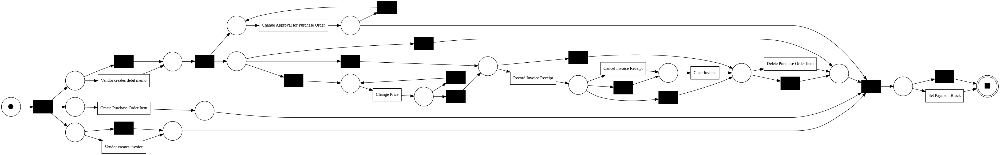

replaying log with TBR, completed variants ::   0%|          | 0/44 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/109 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/44 [00:00<?, ?it/s]

replay based fitness: {'perc_fit_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 1.0, 'percentage_of_fitting_traces': 100.0}
replay based precision: 0.4425046164176599
generalization: 0.7576210090459394
simplicity: 0.6338028169014084


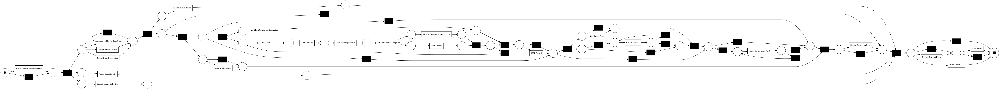

replaying log with TBR, completed variants ::   0%|          | 0/116 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/277 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/116 [00:00<?, ?it/s]

replay based fitness: {'perc_fit_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 1.0, 'percentage_of_fitting_traces': 100.0}
replay based precision: 0.33907850494256053
generalization: 0.9207090318447302
simplicity: 0.642384105960265


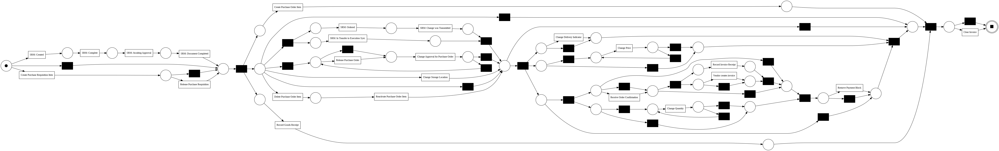

replaying log with TBR, completed variants ::   0%|          | 0/154 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/308 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/154 [00:00<?, ?it/s]

replay based fitness: {'perc_fit_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 1.0, 'percentage_of_fitting_traces': 100.0}
replay based precision: 0.3146911312403391
generalization: 0.9671737148828312
simplicity: 0.6397515527950309


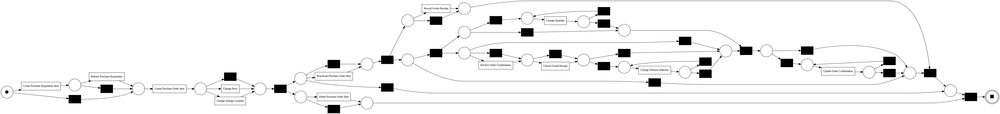

replaying log with TBR, completed variants ::   0%|          | 0/78 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/67 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/78 [00:00<?, ?it/s]

replay based fitness: {'perc_fit_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 1.0, 'percentage_of_fitting_traces': 100.0}
replay based precision: 0.7842231673755317
generalization: 0.8873532299744791
simplicity: 0.6363636363636362


In [ ]:
# inductive minder:
inductive_miner_heatmap = {}
for item in segmentedData:
  net, initial_marking, final_marking = pm4py.discover_petri_net_inductive(segmentedData[item])
  pm4py.view_petri_net(net, initial_marking, final_marking)

  fitness = pm4py.fitness_token_based_replay(segmentedData[item], net, initial_marking, final_marking)
  precision = pm4py.precision_token_based_replay(segmentedData[item], net, initial_marking, final_marking)
  generalization = generalization_evaluator.apply(segmentedData[item], net, initial_marking, final_marking)
  simplicity = simplicity_evaluator.apply(net)

  inductive_miner_heatmap[item] = [fitness["log_fitness"],precision,generalization,simplicity]

  print("replay based fitness:", fitness)
  print("replay based precision:", precision)
  print("generalization:",generalization)
  print("simplicity:",simplicity)

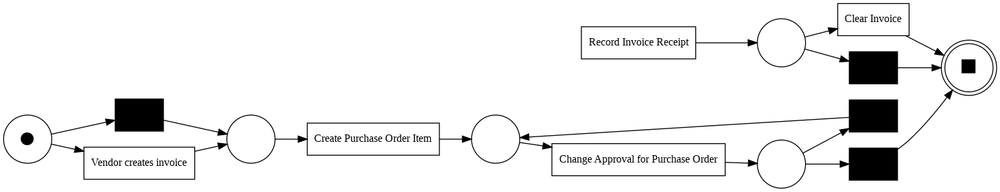

replaying log with TBR, completed variants ::   0%|          | 0/44 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/109 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/44 [00:00<?, ?it/s]

replay based fitness: {'perc_fit_traces': 35.00738552437223, 'average_trace_fitness': 0.9406452675285748, 'log_fitness': 0.9370118367114579, 'percentage_of_fitting_traces': 35.00738552437223}
replay based precision: 0.649874055415617
generalization: 0.844032496655533
simplicity: 0.7894736842105263


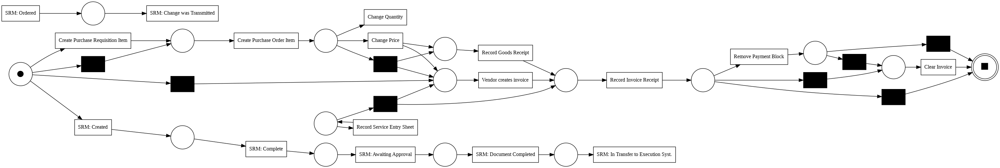

replaying log with TBR, completed variants ::   0%|          | 0/116 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/277 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/116 [00:00<?, ?it/s]

replay based fitness: {'perc_fit_traces': 0.0, 'average_trace_fitness': 0.9323936425789915, 'log_fitness': 0.9306563414259952, 'percentage_of_fitting_traces': 0.0}
replay based precision: 0.7354680332568808
generalization: 0.9216146465843678
simplicity: 0.7192982456140351


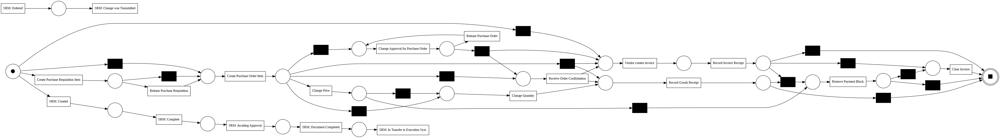

replaying log with TBR, completed variants ::   0%|          | 0/154 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/308 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/154 [00:00<?, ?it/s]

replay based fitness: {'perc_fit_traces': 21.04812292573596, 'average_trace_fitness': 0.9520434782609944, 'log_fitness': 0.9539095623330638, 'percentage_of_fitting_traces': 21.04812292573596}
replay based precision: 0.7678441303735815
generalization: 0.9509226933251235
simplicity: 0.6781609195402298


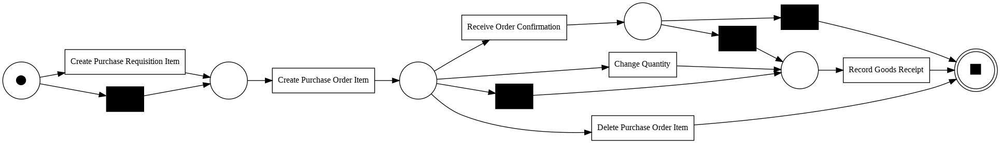

replaying log with TBR, completed variants ::   0%|          | 0/78 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/67 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/78 [00:00<?, ?it/s]

replay based fitness: {'perc_fit_traces': 97.79217662586993, 'average_trace_fitness': 0.9950813141297884, 'log_fitness': 0.9951653944020357, 'percentage_of_fitting_traces': 97.79217662586993}
replay based precision: 0.9981642710106312
generalization: 0.942492019334085
simplicity: 0.6666666666666666


In [ ]:
#Heuristic miner:
heuristic_miner_heatmap = {}
for item in segmentedData:
  net, initial_marking, final_marking = pm4py.discover_petri_net_heuristics(segmentedData[item], dependency_threshold=0.99,and_threshold = 0.99,loop_two_threshold=0.99)
  pm4py.view_petri_net(net, initial_marking, final_marking)

  fitness = pm4py.fitness_token_based_replay(segmentedData[item], net, initial_marking, final_marking)
  precision = pm4py.precision_token_based_replay(segmentedData[item], net, initial_marking, final_marking)
  generalization = generalization_evaluator.apply(segmentedData[item], net, initial_marking, final_marking)
  simplicity = simplicity_evaluator.apply(net)

  heuristic_miner_heatmap[item] = [fitness["log_fitness"],precision,generalization,simplicity]

  print("replay based fitness:", fitness)
  print("replay based precision:", precision)
  print("generalization:",generalization)
  print("simplicity:",simplicity)

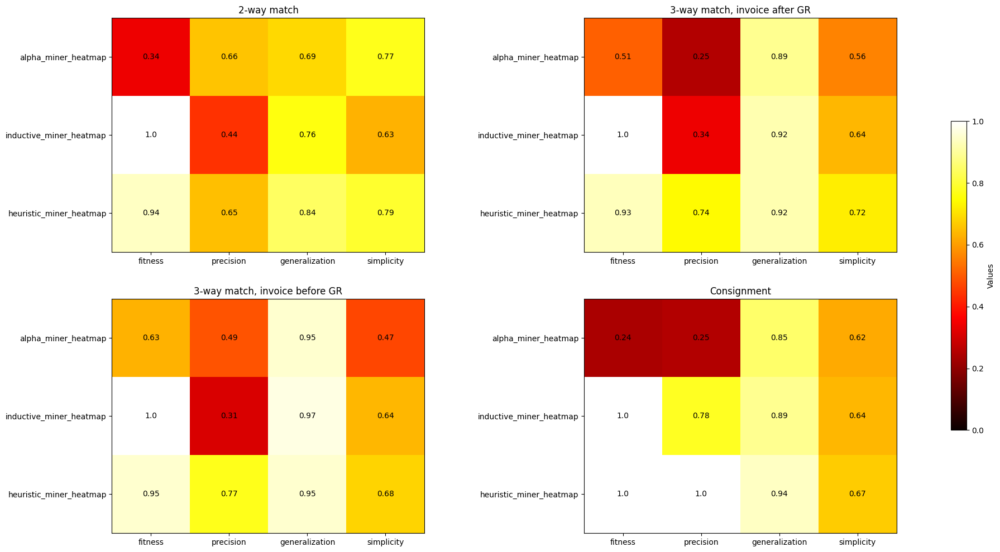

In [ ]:
# drawing heatmap to check performance of each algorithm for each category
x_labels = ["fitness", "precision", "generalization", "simplicity"]
y_labels = ["alpha miner","inductive miner","heuristic miner"]
y_ticks = list(alpha_miner_heatmap.keys())
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(25, 12))
for i, key in enumerate(alpha_miner_heatmap.keys()):
    row = i // 2
    col = i % 2
    values = [alpha_miner_heatmap[key], inductive_miner_heatmap[key], heuristic_miner_heatmap[key]]
    values = np.round(values, decimals=2)
    ax = axes[row, col]
    im = ax.imshow(values, cmap='hot', vmin=0, vmax=1)
    ax.set_title(key)
    ax.set_xticks(np.arange(len(x_labels)))
    ax.set_xticklabels(x_labels)
    ax.set_yticks(np.arange(len(values)))
    ax.set_yticklabels(["alpha_miner_heatmap", "inductive_miner_heatmap", "heuristic_miner_heatmap"])
    for i in range(len(values)):
        for j in range(len(x_labels)):
            text = ax.text(j, i, values[i][j], ha="center", va="center", color="black")
cbar = fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.6)
cbar.ax.set_ylabel('Values')
plt.show()